In [6]:
import pandas as pd
import numpy as np
import json
db=json.load(open(r'F:\Chand\book, resume,psim\PSIM\Books\Books\python\pydata-book-2nd-edition\datasets\usda_food\database.json'))

In [7]:
db

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [8]:
len(db)

6636

In [10]:
db[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [13]:
db[0]['nutrients'][0]

{'value': 25.18,
 'units': 'g',
 'description': 'Protein',
 'group': 'Composition'}

In [14]:
nutrient=pd.DataFrame(db[0]['nutrients'])

In [27]:
nutrient

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [16]:
#when converting a data frame to list,we can specify list to exact. we will take 'description','group,'id','manufacturer'
info_keys=['description','group','id','manufacturer']
info=pd.DataFrame(db,columns=info_keys)
info

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [17]:
info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6636 entries, 0 to 6635
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   description   6636 non-null   object
 1   group         6636 non-null   object
 2   id            6636 non-null   int64 
 3   manufacturer  5195 non-null   object
dtypes: int64(1), object(3)
memory usage: 207.5+ KB


In [20]:
info['group'].value_counts()

Vegetables and Vegetable Products    812
Beef Products                        618
Baked Products                       496
Breakfast Cereals                    403
Fast Foods                           365
Legumes and Legume Products          365
Lamb, Veal, and Game Products        345
Sweets                               341
Fruits and Fruit Juices              328
Pork Products                        328
Beverages                            278
Soups, Sauces, and Gravies           275
Finfish and Shellfish Products       255
Baby Foods                           209
Cereal Grains and Pasta              183
Ethnic Foods                         165
Snacks                               162
Nut and Seed Products                128
Poultry Products                     116
Sausages and Luncheon Meats          111
Dairy and Egg Products               107
Fats and Oils                         97
Meals, Entrees, and Sidedishes        57
Restaurant Foods                      51
Spices and Herbs

In [25]:
nutrient

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [26]:
nutrient.duplicated()[-20:]

142    True
143    True
144    True
145    True
146    True
147    True
148    True
149    True
150    True
151    True
152    True
153    True
154    True
155    True
156    True
157    True
158    True
159    True
160    True
161    True
dtype: bool

In [43]:
#now do some analysis for all the nutrient data to do that,it is easiest to to assemble the nutrients for each food into a single large table
#To do so we need to take some steps
#First i convert each list of food nutrient into a dataframe,add a column for food_id ,append to a list
#last these can be concated together to with concat
food_id_nutrient=[]
for i in range(len(db)):
    nutrient=pd.DataFrame(db[i]['nutrients'])
    nutrient['food_id']=db[i]['id']
    food_id_nutrient.append(nutrient)
full_nutrient=pd.concat(food_id_nutrient,ignore_index=True)

In [44]:
full_nutrient

,value,units,description,group,food_id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [45]:
#i noticed duplicate in the dataframe
#it is easiest to drop the duplicate column
full_nutrient.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
389350    False
389351    False
389352    False
389353    False
389354    False
Length: 389355, dtype: bool

In [46]:
full_nutrient.duplicated().sum()

14179

In [47]:
nutrients=full_nutrient.drop_duplicates()

In [48]:
nutrients

,value,units,description,group,food_id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [49]:
col_mapping={'description':'food','group':'fgroup'}
info=info.rename(columns=col_mapping,copy=False)

In [52]:
info

,food,fgroup,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [53]:
info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6636 entries, 0 to 6635
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   food          6636 non-null   object
 1   fgroup        6636 non-null   object
 2   id            6636 non-null   int64 
 3   manufacturer  5195 non-null   object
dtypes: int64(1), object(3)
memory usage: 207.5+ KB


In [57]:
col_mapping={'description':'nutrient','group':'nutgroup','food_id':'id'}

In [58]:
nutrients=nutrients.rename(columns=col_mapping,copy=False)

In [59]:
nutrients

,value,units,nutrient,nutgroup,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [60]:
#with all this ready we are ready to merge info with nutrients
ndata=pd.merge(nutrients,info,on='id',how='outer')

In [61]:
ndata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 375176 entries, 0 to 375175
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   value         375176 non-null  float64
 1   units         375176 non-null  object 
 2   nutrient      375176 non-null  object 
 3   nutgroup      375176 non-null  object 
 4   id            375176 non-null  int64  
 5   food          375176 non-null  object 
 6   fgroup        375176 non-null  object 
 7   manufacturer  293054 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 25.8+ MB


In [62]:
ndata.iloc[30000]

value                                             0.04
units                                                g
nutrient                                       Glycine
nutgroup                                   Amino Acids
id                                                6158
food            Soup, tomato bisque, canned, condensed
fgroup                      Soups, Sauces, and Gravies
manufacturer                                          
Name: 30000, dtype: object

In [68]:
#now we could make a plot median values by food group and nutrient type
result=ndata.groupby(['nutrient','fgroup'])['value'].quantile(0.5)

In [69]:
result

nutrient          fgroup                           
Adjusted Protein  Sweets                               12.900
                  Vegetables and Vegetable Products     2.180
Alanine           Baby Foods                            0.085
                  Baked Products                        0.248
                  Beef Products                         1.550
                                                        ...  
Zinc, Zn          Snacks                                1.470
                  Soups, Sauces, and Gravies            0.200
                  Spices and Herbs                      2.750
                  Sweets                                0.360
                  Vegetables and Vegetable Products     0.330
Name: value, Length: 2246, dtype: float64

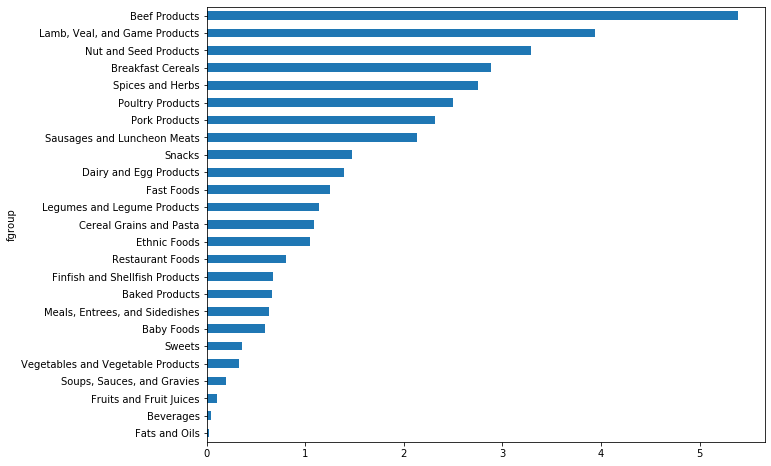

In [77]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(10,8)
result['Zinc, Zn'].sort_values().plot.barh()

In [78]:
#with little cleverence you can find which food is more dence with each nutrients
by_nutrient=ndata.groupby(['nutgroup','nutrient'])

     idxmax() function return the index of the occurance of the maximum over requested axis.while finding the  index of maximum accross any index all NA/null value are excluded.Example: Use idxmax() function to function to find the index of the maximum value along the index axis

In [85]:
get_maximum=lambda x: x.loc[x.value.idxmax()]
get_minimum=lambda x: x.loc[x.value.idxmin()]

In [90]:
max_food=by_nutrient.apply(get_maximum)[['value','food']]


In [89]:
max_food

value units  \
nutgroup    nutrient                                       
Amino Acids Alanine                          8.009     g   
            Arginine                         7.436     g   
            Aspartic acid                   10.203     g   
            Cystine                          1.307     g   
            Glutamic acid                   17.452     g   
...                                            ...   ...   
Vitamins    Vitamin D2 (ergocalciferol)     28.100   mcg   
            Vitamin D3 (cholecalciferol)    27.400   mcg   
            Vitamin E (alpha-tocopherol)   149.400    mg   
            Vitamin E, added                46.550    mg   
            Vitamin K (phylloquinone)     1714.500   mcg   

                                                              nutrient  \
nutgroup    nutrient                                                     
Amino Acids Alanine                                            Alanine   
            Arginine                                          Arginine   
            Aspartic acid                                Aspartic acid   
            Cystine                                            Cystine   
            Glutamic acid                                Glutamic acid   
...                                                                ...   
Vitamins    Vitamin D2 (ergocalciferol)    Vitamin D2 (ergocalciferol)   
            Vitamin D3 (cholecalciferol)  Vitamin D3 (cholecalciferol)   
            Vitamin E (alpha-tocopherol)  Vitamin E (alpha-tocopherol)   
            Vitamin E, added                          Vitamin E, added   
            Vitamin K (phylloquinone)        Vitamin K (phylloquinone)   

                                             nutgroup     id  \
nutgroup    nutrient                                           
Amino Acids Alanine                       Amino Acids  19177   
            Arginine                      Amino Acids  12033   
            Aspartic acid                 Amino Acids  16122   
            Cystine                       Amino Acids  12008   
            Glutamic acid                 Amino Acids  16122   
...                                               ...    ...   
Vitamins    Vitamin D2 (ergocalciferol)      Vitamins  11993   
            Vitamin D3 (cholecalciferol)     Vitamins  15038   
            Vitamin E (alpha-tocopherol)     Vitamins   4038   
            Vitamin E, added                 Vitamins   8087   
            Vitamin K (phylloquinone)        Vitamins   2038   

                                                                                       food  \
nutgroup    nutrient                                                                          
Amino Acids Alanine                                       Gelatins, dry powder, unsweetened   
            Arginine                                           Seeds, sesame flour, low-fat   
            Aspartic acid                                               Soy protein isolate   
            Cystine                            Seeds, cottonseed flour, low fat (glandless)   
            Glutamic acid                                               Soy protein isolate   
...                                                                                     ...   
Vitamins    Vitamin D2 (ergocalciferol)                             Mushrooms, maitake, raw   
            Vitamin D3 (cholecalciferol)                      Fish, halibut, Greenland, raw   
            Vitamin E (alpha-tocopherol)                                    Oil, wheat germ   
            Vitamin E, added              Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...   
            Vitamin K (phylloquinone)                                  Spices, sage, ground   

                                                                     fgroup  \
nutgroup    nutrient                                                          
Amino Acids Alanine                                                  Sweet

In [91]:
by_nutrient.apply(get_maximum)

value units  \
nutgroup    nutrient                                       
Amino Acids Alanine                          8.009     g   
            Arginine                         7.436     g   
            Aspartic acid                   10.203     g   
            Cystine                          1.307     g   
            Glutamic acid                   17.452     g   
...                                            ...   ...   
Vitamins    Vitamin D2 (ergocalciferol)     28.100   mcg   
            Vitamin D3 (cholecalciferol)    27.400   mcg   
            Vitamin E (alpha-tocopherol)   149.400    mg   
            Vitamin E, added                46.550    mg   
            Vitamin K (phylloquinone)     1714.500   mcg   

                                                              nutrient  \
nutgroup    nutrient                                                     
Amino Acids Alanine                                            Alanine   
            Arginine                                          Arginine   
            Aspartic acid                                Aspartic acid   
            Cystine                                            Cystine   
            Glutamic acid                                Glutamic acid   
...                                                                ...   
Vitamins    Vitamin D2 (ergocalciferol)    Vitamin D2 (ergocalciferol)   
            Vitamin D3 (cholecalciferol)  Vitamin D3 (cholecalciferol)   
            Vitamin E (alpha-tocopherol)  Vitamin E (alpha-tocopherol)   
            Vitamin E, added                          Vitamin E, added   
            Vitamin K (phylloquinone)        Vitamin K (phylloquinone)   

                                             nutgroup     id  \
nutgroup    nutrient                                           
Amino Acids Alanine                       Amino Acids  19177   
            Arginine                      Amino Acids  12033   
            Aspartic acid                 Amino Acids  16122   
            Cystine                       Amino Acids  12008   
            Glutamic acid                 Amino Acids  16122   
...                                               ...    ...   
Vitamins    Vitamin D2 (ergocalciferol)      Vitamins  11993   
            Vitamin D3 (cholecalciferol)     Vitamins  15038   
            Vitamin E (alpha-tocopherol)     Vitamins   4038   
            Vitamin E, added                 Vitamins   8087   
            Vitamin K (phylloquinone)        Vitamins   2038   

                                                                                       food  \
nutgroup    nutrient                                                                          
Amino Acids Alanine                                       Gelatins, dry powder, unsweetened   
            Arginine                                           Seeds, sesame flour, low-fat   
            Aspartic acid                                               Soy protein isolate   
            Cystine                            Seeds, cottonseed flour, low fat (glandless)   
            Glutamic acid                                               Soy protein isolate   
...                                                                                     ...   
Vitamins    Vitamin D2 (ergocalciferol)                             Mushrooms, maitake, raw   
            Vitamin D3 (cholecalciferol)                      Fish, halibut, Greenland, raw   
            Vitamin E (alpha-tocopherol)                                    Oil, wheat germ   
            Vitamin E, added              Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...   
            Vitamin K (phylloquinone)                                  Spices, sage, ground   

                                                                     fgroup  \
nutgroup    nutrient                                                          
Amino Acids Alanine                                                  Sweet

In [92]:
max_food.food

nutgroup     nutrient                    
Amino Acids  Alanine                                         Gelatins, dry powder, unsweetened
             Arginine                                             Seeds, sesame flour, low-fat
             Aspartic acid                                                 Soy protein isolate
             Cystine                              Seeds, cottonseed flour, low fat (glandless)
             Glutamic acid                                                 Soy protein isolate
                                                                   ...                        
Vitamins     Vitamin D2 (ergocalciferol)                               Mushrooms, maitake, raw
             Vitamin D3 (cholecalciferol)                        Fish, halibut, Greenland, raw
             Vitamin E (alpha-tocopherol)                                      Oil, wheat germ
             Vitamin E, added                Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...
        

In [93]:
# make the food little smaller
max_food.food=max_food.food.str[:50]

nutgroup     nutrient                    
Amino Acids  Alanine                                         Gelatins, dry powder, unsweetened
             Arginine                                             Seeds, sesame flour, low-fat
             Aspartic acid                                                 Soy protein isolate
             Cystine                              Seeds, cottonseed flour, low fat (glandless)
             Glutamic acid                                                 Soy protein isolate
                                                                   ...                        
Vitamins     Vitamin D2 (ergocalciferol)                               Mushrooms, maitake, raw
             Vitamin D3 (cholecalciferol)                        Fish, halibut, Greenland, raw
             Vitamin E (alpha-tocopherol)                                      Oil, wheat germ
             Vitamin E, added                Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...
        

In [94]:
#the resulting dataframe is large to display here
#here is only 'Amino Acid' nutrient group
max_food.loc['Amino Acids']['food']

nutrient
Alanine                           Gelatins, dry powder, unsweetened
Arginine                               Seeds, sesame flour, low-fat
Aspartic acid                                   Soy protein isolate
Cystine                Seeds, cottonseed flour, low fat (glandless)
Glutamic acid                                   Soy protein isolate
Glycine                           Gelatins, dry powder, unsweetened
Histidine                Whale, beluga, meat, dried (Alaska Native)
Hydroxyproline    KENTUCKY FRIED CHICKEN, Fried Chicken, ORIGINA...
Isoleucine        Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Leucine           Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Lysine            Seal, bearded (Oogruk), meat, dried (Alaska Na...
Methionine                    Fish, cod, Atlantic, dried and salted
Phenylalanine     Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Proline                           Gelatins, dry powder, unsweetened
Serine            Soy protein isolate, 